<a href="https://colab.research.google.com/github/langat-che/Crop_disease_prediction_and_recommendation_system/blob/bev%2Fupdates/CDRR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Business Understanding

## 1.1 Problem Statement
**Business Context**
Agriculture remains a key economic sector in many African countries, especially in Kenya and across sub-Saharan Africa, where it employs over 60% of the population and contributes significantly to GDP. However, pest and disease outbreaks in staple crops like tomato, maize, and onion cause substantial yield losses — often up to 40% or more — affecting food security, farmer incomes, and market stability. These losses often go undetected until it's too late, especially among smallholder farmers who may lack access to timely agronomic advice or diagnostics. The TOM2024 dataset was developed to tackle this challenge through data-driven innovation, empowering stakeholders with accurate, scalable tools for crop health monitoring.

**Problem:**
Small holder farmers often lack:
- Timely diagnosis of plant diseases
- Access to expert advice or affordable treatment
- Scalable, easy-to-use tools

---

## 1.2 Objectives
**Main Goal**
Build an AI-powered system that detects crop diseases and provides relevant treatment recommendations.

**Specific Objectives:**
1. Collect and clean image + metadata of crops (healthy and diseased)
2. Train an ML/DL model to identify crop diseases
3. Develop a recommendation engine for treatment and prevention
4. Build a user-friendly platform for farmers to interact with the system.
5. Demonstrate potential impact on yield, cost saving and power empowerment.

---

## 1.3 Metrics of Success
To evaluate the effectiveness and impact of the system:

### Model Performance
- **Accuracy, Precision, Recall, and F1-score** of the disease prediction model
- **Confusion matrix** to assess misclassification of disease types
- **Model latency** (how fast predictions are returned)

### Usability & Adoption
- **User satisfaction scores** (via surveys)
- **Adoption rate** among smallholder farmers
- **Task success rate** (successful image uploads and predictions)

---

## 1.4 External Relevance & Risk Factors
Key external elements that could affect success:

### Data Challenges
- Limited or low-quality labeled datasets
- Variations in disease appearance across regions

### Infrastructure & Access
- Poor rural internet or electricity
- Limited access to recommended agrovet products

### Policy & Ethics
- Data privacy concerns (image uploads)
- Government or regulatory compliance

### Environmental Factors
- Seasonal disease variations
- Climate change influencing disease patterns

# 2. Data Understanding

The success of the crop disease prediction system relies heavily on the quality and diversity of the data used to train and evaluate the models. This section outlines the dataset being used—**TOM2024**—and its relevance, structure, and characteristics.

## 2.1 Dataset Overview

The **TOM2024 dataset** is a comprehensive agricultural dataset that contains:

- **Total images**: 25,844 raw images  
- **Labeled images**: 12,227 expert-labeled images  
- **Crop types**: Tomato, Maize, Onion  
- **Classes**: 30 classes covering pests and diseases  
- **Image resolution**: High-quality images captured under varied environmental conditions

This dataset is especially valuable for building machine learning and deep learning models for plant health diagnostics, enabling early detection and informed responses to crop threats.

## 2.2 Purpose and Value

- Facilitates **early and accurate pest/disease identification**
- Supports **precision agriculture** and **reduced pesticide use**
- Enables **regionally adaptable AI models**
- Usable for **education**, **extension services**, and **digital agriculture tools**

## 2.3 Data Structure

| Field/Aspect         | Description |
|----------------------|-------------|
| `image`              | High-resolution image of plant leaf or crop symptom |
| `crop_type`          | Categorical: tomato, maize, onion |
| `issue_type`         | Categorical: pest or disease |
| `class_label`        | Specific pest/disease (30 classes) |
| `environment_context`| Field conditions, lighting, background elements |
| `expert_verified`    | Boolean: whether image has been validated by an expert |

## 2.4 Data Collection Methodology

The dataset was curated using a systematic approach:

1. **Site Selection** – Representative agricultural areas chosen
2. **Image Acquisition** – Raw images collected in-field using mobile devices
3. **Image Grouping** – By crop type and visible issue (pest/disease)
4. **Issue Identification** – Initial tagging by field experts
5. **Image Cropping/Resizing** – For consistency and model-readiness
6. **Expert Validation** – Cropped images verified by trained agronomists
7. **Storage and Structuring** – Organized for easy access by researchers

## 2.5 Data Quality & Variability

- Images captured in **diverse lighting, backgrounds, and leaf stages**
- **Label imbalance** may exist across certain pests/diseases
- High **label accuracy** due to expert validation
- **Realistic variation** in field conditions enhances model robustness

## 2.6 Dataset Directory Structure

The TOM2024 dataset is divided into two main categories, each with a unique structure that supports different stages of model development.

---

### 📁 Category A – Raw Labeled Collections

This category consists of image folders grouped by **crop type** and **issue type** (pests, diseases, or pest activities). It serves as the initial labeled dataset for exploration, augmentation, or additional curation.

---

Each subfolder contains images representing a specific pest, disease, or activity affecting the respective crop. These images are labeled and may vary in lighting, background, and clarity to simulate real-world field conditions.

---

### 📁 Category B – Train/Test Data for Model Training

Category B is structured to support supervised machine learning and deep learning model training. Each crop folder contains `train` and `test` subfolders, and within those are class folders labeled according to the condition:

- **`_d`** → Disease  
- **`_p`** → Pest  
- **`_a`** → Pest Activity (maize only)  
- A separate folder for **healthy** plants is included in each case.



In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
zip_path = '/content/drive/My Drive/Data.zip'

In [5]:
import zipfile
import os

extract_path = '/content/dataset'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [6]:
# importing necessary libraries
import re
import hashlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import cv2
import seaborn as sns
from PIL import Image, UnidentifiedImageError

### Loading and exploring the Dataset

In [7]:
dataset_path = '/content/dataset/Data'

In [8]:
# Exploring subfolders within "Category A" or "Category B"
category_a_path = os.path.join(dataset_path, 'CATEGORY_A')
category_b_path = os.path.join(dataset_path, 'CATEGORY_B')

# Checking the subfolders in Category A (Maize diseases as an example)
maize_diseases_path = os.path.join(category_a_path, 'maize_diseases')
disease_folders = os.listdir(maize_diseases_path)
print("\nDisease categories in Maize:", disease_folders)


Disease categories in Maize: ['Abiotic_disease-D', 'Helminthosporiosis-D', 'Healthy_leaf', 'Curvularia-D', 'Rust-D', 'Virosis-D', 'Stripe-D']


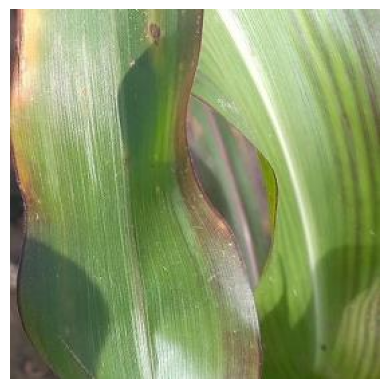

In [9]:
# Loading and display sample images from the "Maize" disease categories
def display_image(image_path):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

# Displaying a sample image from "Abiotic_disease-D" folder
sample_image_path = os.path.join(maize_diseases_path, 'Abiotic_disease-D', os.listdir(os.path.join(maize_diseases_path, 'Abiotic_disease-D'))[0])
display_image(sample_image_path)

### Counting images in all categories and subfolders

In [10]:

# Function to count images in all categories and subfolders
def count_images_in_folders(path):
    image_counts = {}

    # Walk through the folder and subfolders
    for root, dirs, files in os.walk(path):
        # Filter out non-image files (you can adjust the file extensions if needed)
        image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

        # Count the number of images in each folder
        if image_files:
            folder_name = os.path.relpath(root, path)  # Get relative path from the root folder
            image_counts[folder_name] = len(image_files)

    return image_counts

# Count images in Category A and Category B
category_a_path = '/content/dataset/Data/CATEGORY_A'
category_b_path = '/content/dataset/Data/CATEGORY_B'

category_a_image_counts = count_images_in_folders(category_a_path)
category_b_image_counts = count_images_in_folders(category_b_path)

# Combine the counts from both categories
all_image_counts = {**category_a_image_counts, **category_b_image_counts}

# Display the results
print("Total image counts in all categories and subfolders:")
for category, count in all_image_counts.items():
    print(f"{category}: {count} images")


Total image counts in all categories and subfolders:
maize_diseases/Abiotic_disease-D: 77 images
maize_diseases/Helminthosporiosis-D: 159 images
maize_diseases/Healthy_leaf: 585 images
maize_diseases/Curvularia-D: 259 images
maize_diseases/Rust-D: 99 images
maize_diseases/Virosis-D: 148 images
maize_diseases/Stripe-D: 2190 images
tomato_diseases/Mite_d: 390 images
tomato_diseases/healthy_fruit: 552 images
tomato_diseases/exces_nitrogen_d: 43 images
tomato_diseases/Blossom_end_rot_d: 118 images
tomato_diseases/tomato_late_blight_d: 74 images
tomato_diseases/sunburn_d: 51 images
tomato_diseases/healthy_leaf: 782 images
tomato_diseases/alternaria_mite_d: 8 images
tomato_diseases/fusarium_d: 18 images
tomato_diseases/alternaria_d: 322 images
tomato_diseases/virosis_d: 1542 images
tomato_diseases/Bacterial_floundering_d: 252 images
onion_pests/Caterpillar-P: 879 images
maize_pests_activities/Spodotera_frugiperda- A: 616 images
maize_pests/Aphids-P: 4 images
maize_pests/Spodoptera_frugiperda

#### **Based on category A, these are counts for each subfolders**


#### **Onion Diseases:**

  - Healthy Leaf: 679 images

  - Fusarium-D: 738 images

- Virosis-D: 203 images

- Bulb Blight-D: 30 images

- Alternaria-D: 515 images

#### **Onion Pests:**

- Caterpillar-P: 879 images

#### **Maize Pests:**

- Spodoptera frugiperda-A: 616 images

- Aphids-P: 4 images

- Spodoptera frugiperda-P: 610 images

#### **Maize Diseases:**

- Virosis-D: 148 images

- Stripe-D: 2,190 images

- Helminthosporiosis-D: 159 images

- Healthy Leaf: 585 images

- Rust-D: 99 images

- Abiotic Disease-D: 77 images

- Curvularia-D: 259 images

#### **Tomato Pests:**

- Helicoverpa armigera-P: 278 images

- Tuta Absoluta-P: 19 images

#### **Tomato Diseases:**

- Virosis-D: 1,542 images

- Sunburn-D: 51 images

- Tomato Late Blight-D: 74 images

- Healthy Fruit: 552 images

- Healthy Leaf: 782 images

#### **Mite-D: 390 images:**

- Excess Nitrogen-D: 43 images

- Blossom End Rot-D: 118 images

- Bacterial Floundering-D: 252 images

- Fusarium-D: 18 images

- Alternaria-D: 322 images

- Alternaria Mite-D: 8 images

### **Based on category B, these are counts for each subfolders**

#### **Onion with Data Augmentation (Training):**

- Healthy Leaf: 4,400 images

- Virosis-D: 1,016 images

- Fusarium-D: 4,400 images

- Caterpillars-P: 4,408 images

- Bulb Blight-D: 934 images

- Alternaria-D: 4,398 images

#### **Onion with Data Augmentation (Testing):**

- Alternaria-D: 630 images

- Caterpillars-P: 1,358 images

- Bulb Blight-D: 380 images

- Fusarium-D: 1,076 images

- Virosis-D: 412 images

- Healthy Leaf: 958 images

#### **Maize with Data Augmentation (Training):**

- Stripe-D: 2,200 images

- Spodoptera frugiperda-P: 2,200 images

- Spodoptera frugiperda: 2,200 images

- Healthy Leaf: 2,200 images

- Helminthosporiosis-D: 2,200 images

- Rust-D: 1,298 images

- Abiotic Diseases-D: 770 images

- Curvulariosis-D: 2,200 images

- Aphids-P: 440 images

#### **Maize with Data Augmentation (Testing):**

- Stripe-D: 4,278 images

- Spodoptera frugiperda-P: 1,000 images

- Rust-D: 80 images

- Spodoptera frugiperda-A: 1,032 images

- Abiotic Diseases-D: 120 images

- Helminthosporiosis-D: 177 images

- Aphids-P: 60 images

- Healthy Leaf: 1,119 images

- Curvulariosis-D: 477 images

#### **Tomato with Data Augmentation (Testing):**

- Virosis-D: 2,884 images

- Tomato Late Blight-D: 238 images

- Tuta Absoluta-P: 274 images

- Excess Nitrogen-D: 230 images

- Mite-P: 580 images

- Sunburn-D: 238 images

- Fusarium-D: 232 images

- Blossom End Rot: 272 images

- Healthy Leaf: 904 images

- Healthy Leaf (another folder): 1,363 images

- Alternaria Mite-D: 119 images

- Bacterial Floundering-D: 304 images

- Helicoverpa armigera-P: 356 images

- Alternaria-D: 444 images

#### **Tomato with Data Augmentation (Training):**

- Helicoverpa armigera-P: 2,200 images

- Tomato Late Blight: 1,100 images

- Sunburn-D: 1,108 images

- Excess Nitrogen-D: 1,100 images

- Tuta Absoluta-P: 137 images

- Mite-D: 1,946 images

- Virosis-D: 1,449 images

- Healthy Leaf: 2,210 images

- Healthy Fruit: 2,200 images

- Fusarium-D: 2,200 images

- Blossom End Rot-D: 1,342 images

- Alternaria Mite-D: 2,200 images

- Bacterial Floundering-D: 3,364 images

- Alternaria-D: 2,200 images

### **Visual presentation of the above information**

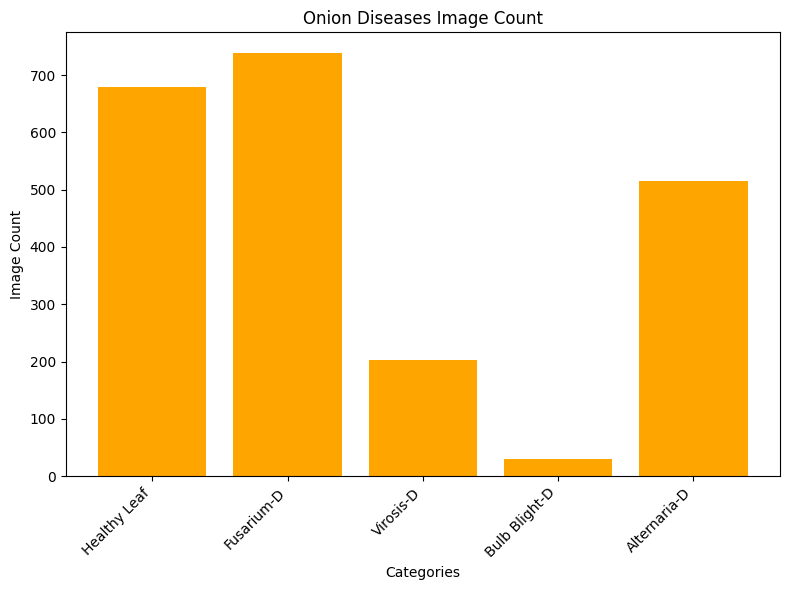

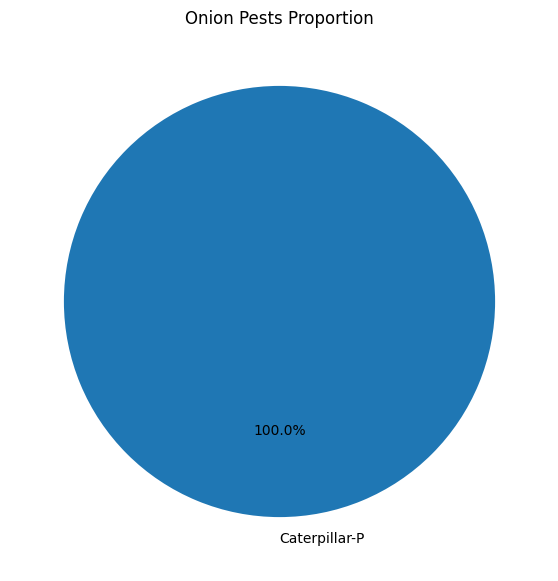

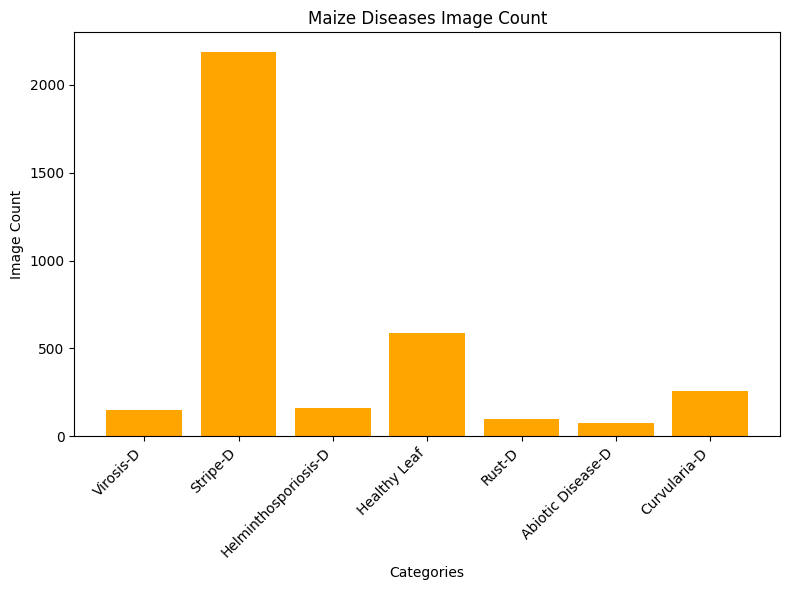

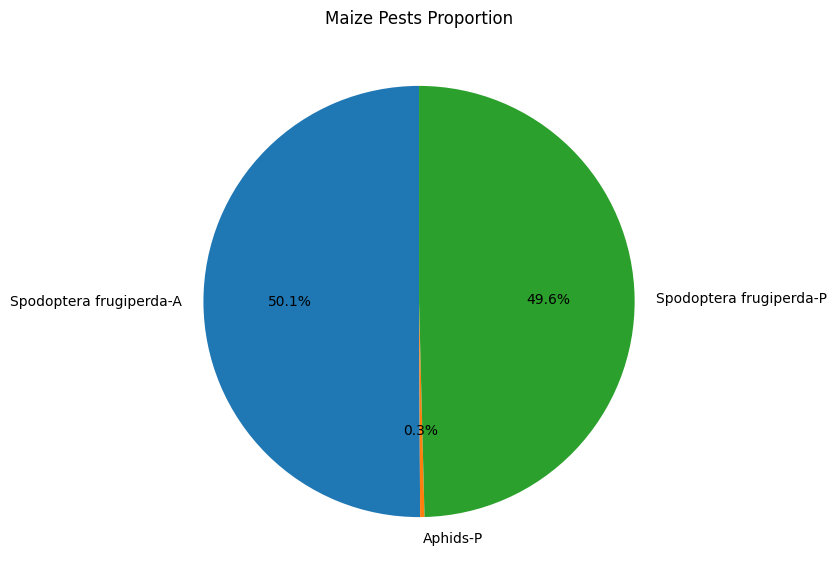

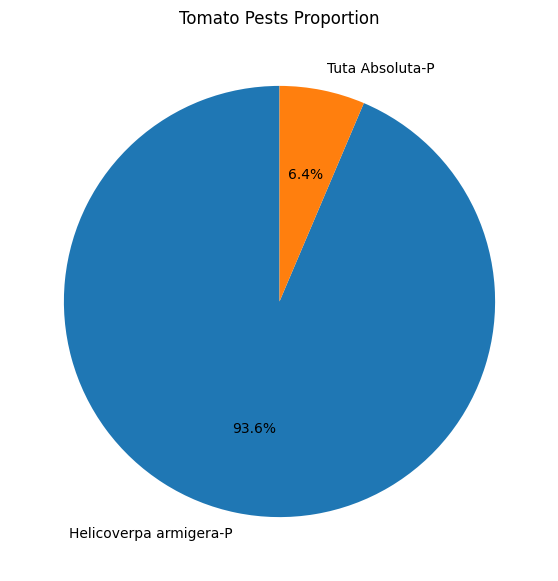

...

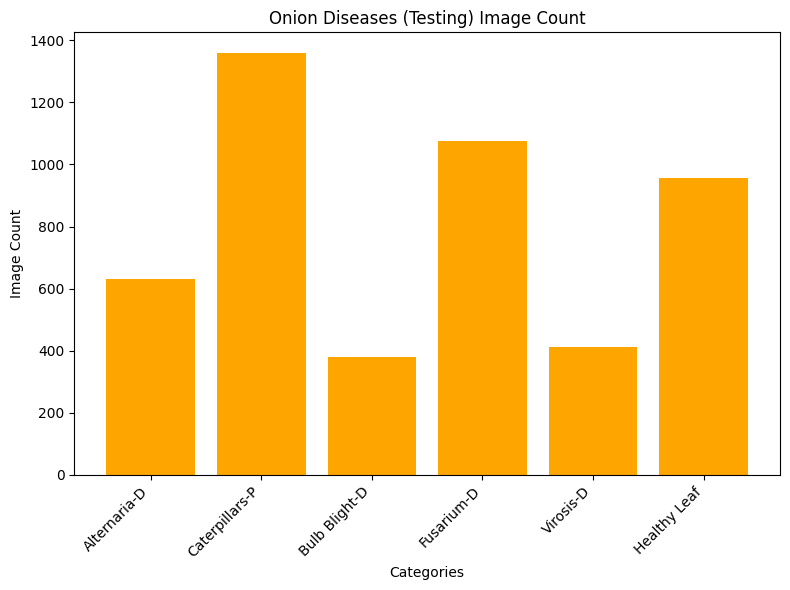

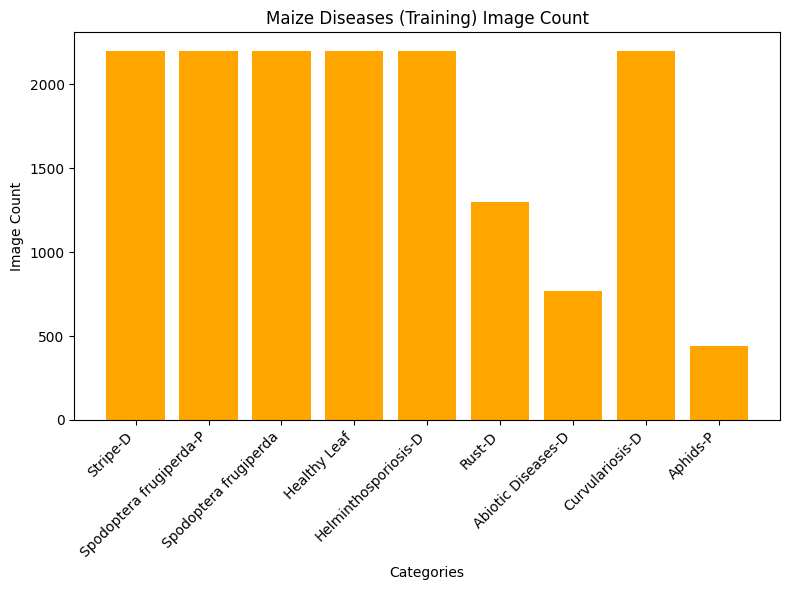

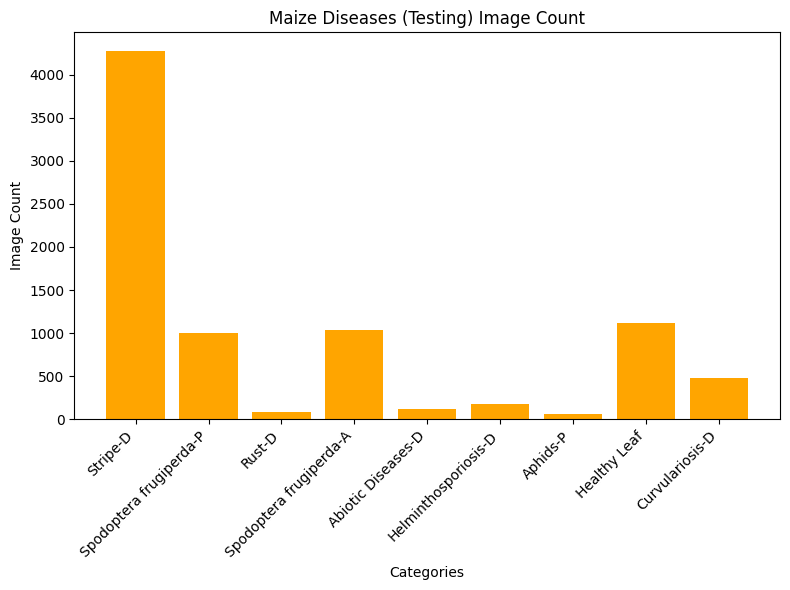

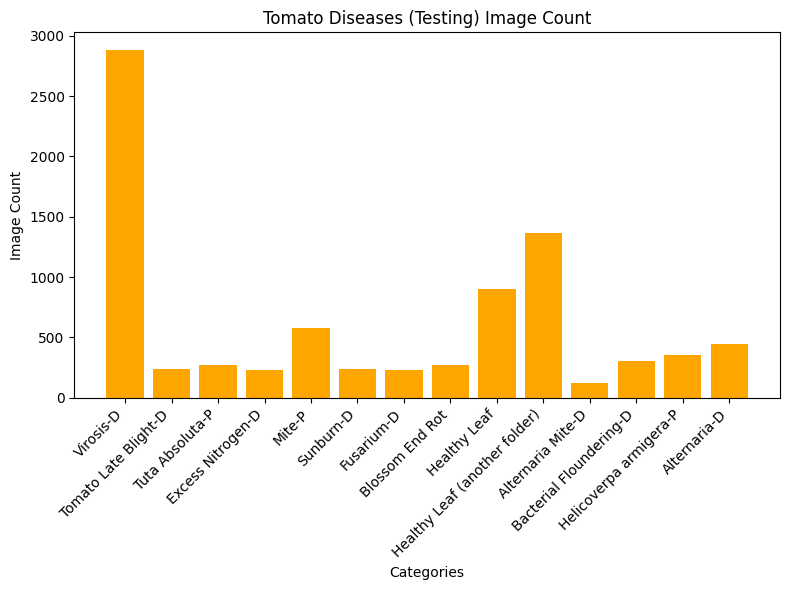

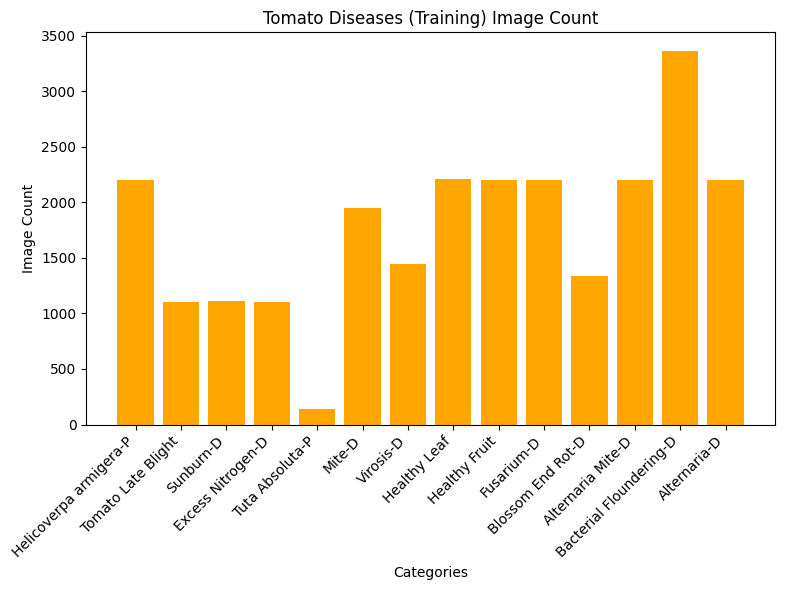

In [11]:
#Visual presentation of the above information

# Data for Category A subfolders
onion_diseases_A = {
    "Healthy Leaf": 679,
    "Fusarium-D": 738,
    "Virosis-D": 203,
    "Bulb Blight-D": 30,
    "Alternaria-D": 515
}

onion_pests_A = {
    "Caterpillar-P": 879
}

maize_pests_A = {
    "Spodoptera frugiperda-A": 616,
    "Aphids-P": 4,
    "Spodoptera frugiperda-P": 610
}

maize_diseases_A = {
    "Virosis-D": 148,
    "Stripe-D": 2190,
    "Helminthosporiosis-D": 159,
    "Healthy Leaf": 585,
    "Rust-D": 99,
    "Abiotic Disease-D": 77,
    "Curvularia-D": 259
}

tomato_pests_A = {
    "Helicoverpa armigera-P": 278,
    "Tuta Absoluta-P": 19
}

tomato_diseases_A = {
    "Virosis-D": 1542,
    "Sunburn-D": 51,
    "Tomato Late Blight-D": 74,
    "Healthy Fruit": 552,
    "Healthy Leaf": 782,
    "Mite-D": 390,
    "Excess Nitrogen-D": 43,
    "Blossom End Rot-D": 118,
    "Bacterial Floundering-D": 252,
    "Fusarium-D": 18,
    "Alternaria-D": 322,
    "Alternaria Mite-D": 8
}

# Data for Category B subfolders (with data augmentation)
onion_diseases_B_train = {
    "Healthy Leaf": 4400,
    "Virosis-D": 1016,
    "Fusarium-D": 4400,
    "Caterpillars-P": 4408,
    "Bulb Blight-D": 934,
    "Alternaria-D": 4398
}

onion_diseases_B_test = {
    "Alternaria-D": 630,
    "Caterpillars-P": 1358,
    "Bulb Blight-D": 380,
    "Fusarium-D": 1076,
    "Virosis-D": 412,
    "Healthy Leaf": 958
}

maize_diseases_B_train = {
    "Stripe-D": 2200,
    "Spodoptera frugiperda-P": 2200,
    "Spodoptera frugiperda": 2200,
    "Healthy Leaf": 2200,
    "Helminthosporiosis-D": 2200,
    "Rust-D": 1298,
    "Abiotic Diseases-D": 770,
    "Curvulariosis-D": 2200,
    "Aphids-P": 440
}

maize_diseases_B_test = {
    "Stripe-D": 4278,
    "Spodoptera frugiperda-P": 1000,
    "Rust-D": 80,
    "Spodoptera frugiperda-A": 1032,
    "Abiotic Diseases-D": 120,
    "Helminthosporiosis-D": 177,
    "Aphids-P": 60,
    "Healthy Leaf": 1119,
    "Curvulariosis-D": 477
}

tomato_diseases_B_test = {
    "Virosis-D": 2884,
    "Tomato Late Blight-D": 238,
    "Tuta Absoluta-P": 274,
    "Excess Nitrogen-D": 230,
    "Mite-P": 580,
    "Sunburn-D": 238,
    "Fusarium-D": 232,
    "Blossom End Rot": 272,
    "Healthy Leaf": 904,
    "Healthy Leaf (another folder)": 1363,
    "Alternaria Mite-D": 119,
    "Bacterial Floundering-D": 304,
    "Helicoverpa armigera-P": 356,
    "Alternaria-D": 444
}

tomato_diseases_B_train = {
    "Helicoverpa armigera-P": 2200,
    "Tomato Late Blight": 1100,
    "Sunburn-D": 1108,
    "Excess Nitrogen-D": 1100,
    "Tuta Absoluta-P": 137,
    "Mite-D": 1946,
    "Virosis-D": 1449,
    "Healthy Leaf": 2210,
    "Healthy Fruit": 2200,
    "Fusarium-D": 2200,
    "Blossom End Rot-D": 1342,
    "Alternaria Mite-D": 2200,
    "Bacterial Floundering-D": 3364,
    "Alternaria-D": 2200
}

# Function to plot pie chart
def plot_pie_chart(data, title):
    plt.figure(figsize=(7, 7))
    plt.pie(data.values(), labels=data.keys(), autopct='%1.1f%%', startangle=90)
    plt.title(title)
    plt.show()

# Function to plot bar chart
def plot_bar_chart(data, title):
    plt.figure(figsize=(8, 6))
    plt.bar(data.keys(), data.values(), color='orange')
    plt.xlabel('Categories')
    plt.ylabel('Image Count')
    plt.title(title)
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

# Visualizations for Category A
plot_bar_chart(onion_diseases_A, "Onion Diseases Image Count")
plot_pie_chart(onion_pests_A, "Onion Pests Proportion")
plot_bar_chart(maize_diseases_A, "Maize Diseases Image Count")
plot_pie_chart(maize_pests_A, "Maize Pests Proportion")
plot_pie_chart(tomato_pests_A, "Tomato Pests Proportion")
plot_bar_chart(tomato_diseases_A, "Tomato Diseases Image Count")

# Visualizations for Category B (with Data Augmentation)
plot_bar_chart(onion_diseases_B_train, "Onion Diseases (Training) Image Count")
plot_bar_chart(onion_diseases_B_test, "Onion Diseases (Testing) Image Count")
plot_bar_chart(maize_diseases_B_train, "Maize Diseases (Training) Image Count")
plot_bar_chart(maize_diseases_B_test, "Maize Diseases (Testing) Image Count")
plot_bar_chart(tomato_diseases_B_test, "Tomato Diseases (Testing) Image Count")
plot_bar_chart(tomato_diseases_B_train, "Tomato Diseases (Training) Image Count")

### Checking for Class imbalance

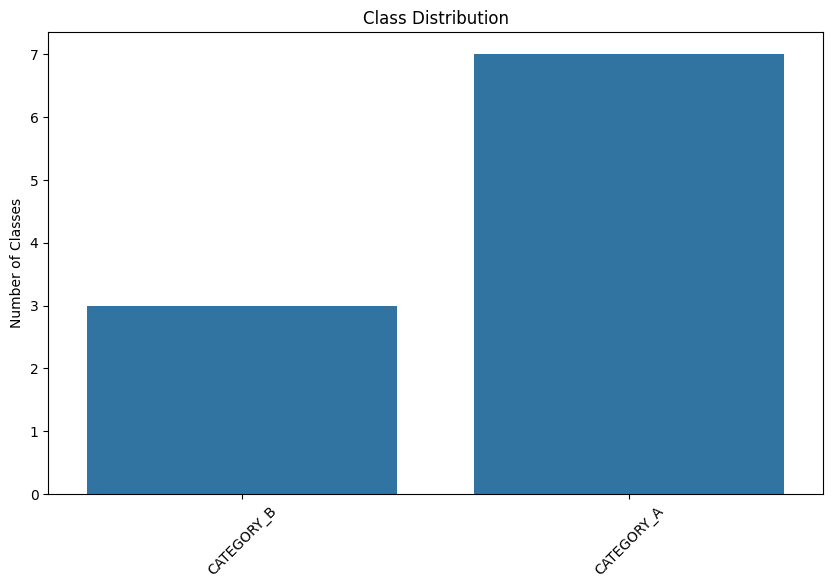

In [12]:
class_counts = {}
for cls in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, cls)
    if os.path.isdir(class_path):
        class_counts[cls] = len(os.listdir(class_path))

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
plt.title("Class Distribution")
plt.ylabel("Number of Classes")
plt.xticks(rotation=45)
plt.show()

# 3. Data Preparation
Before training the model, the dataset underwent several steps of cleaning, labeling, augmentation, and formatting to ensure it is suitable for machine learning tasks.

---

## 3.1 Data Cleaning

- Removing white spaces from folder names
- Channging all D and Ps to lower caps
- Removed duplicate or corrupted image files.
- Ensured consistent image formats (e.g., `.jpg`, `.png`) and resized images to a standard size (e.g., 224x224 pixels).
- Verified class labels for each folder based on metadata and visual inspection.
- Excluded low-quality or highly blurred images that could introduce noise into the model.
- removing Noisy Images

### 3.1.1 Handling the folder names

In [13]:
# Step 1: Replace hyphens with spaces
def replace_hyphens_with_spaces(root_dir):
    for root, dirs, files in os.walk(root_dir, topdown=False):
        for name in files:
            if '-' in name:
                old_path = os.path.join(root, name)
                new_name = name.replace('-', ' ')
                new_path = os.path.join(root, new_name)
                os.rename(old_path, new_path)
        for name in dirs:
            if '-' in name:
                old_path = os.path.join(root, name)
                new_name = name.replace('-', ' ')
                new_path = os.path.join(root, new_name)
                os.rename(old_path, new_path)

# Step 2: Replace spaces with underscores
def rename_all(root_dir):
    for root, dirs, files in os.walk(root_dir, topdown=False):
        for name in files:
            if ' ' in name:
                old_path = os.path.join(root, name)
                new_name = name.replace(' ', '_')
                new_path = os.path.join(root, new_name)
                os.rename(old_path, new_path)
        for name in dirs:
            if ' ' in name:
                old_path = os.path.join(root, name)
                new_name = name.replace(' ', '_')
                new_path = os.path.join(root, new_name)
                os.rename(old_path, new_path)

# Step 3: Collapse multiple underscores
def clean_names(root_dir):
    for root, dirs, files in os.walk(root_dir, topdown=False):
        for name in files:
            new_name = re.sub(r'_+', '_', name)
            if new_name != name:
                old_path = os.path.join(root, name)
                new_path = os.path.join(root, new_name)
                os.rename(old_path, new_path)
        for name in dirs:
            new_name = re.sub(r'_+', '_', name)
            if new_name != name:
                old_path = os.path.join(root, name)
                new_path = os.path.join(root, new_name)
                os.rename(old_path, new_path)

# Step 4: Fix diseases ending with D and pests ending with P (folder & file names)
def fix_disease_pest_labels(root_dir):
    for root, dirs, files in os.walk(root_dir, topdown=False):
        for name in files:
            name_wo_ext, ext = os.path.splitext(name)
            new_name_wo_ext = re.sub(r'(?<=\w)D$', 'd', name_wo_ext)
            new_name_wo_ext = re.sub(r'(?<=\w)P$', 'p', new_name_wo_ext)
            if new_name_wo_ext != name_wo_ext:
                old_path = os.path.join(root, name)
                new_path = os.path.join(root, new_name_wo_ext + ext)
                os.rename(old_path, new_path)
        for name in dirs:
            new_name = re.sub(r'(?<=\w)D$', 'd', name)
            new_name = re.sub(r'(?<=\w)P$', 'p', new_name)
            if new_name != name:
                old_path = os.path.join(root, name)
                new_path = os.path.join(root, new_name)
                os.rename(old_path, new_path)

# Step 5: Lowercase all folders and subfolders under CATEGORY_A and CATEGORY_B
def lowercase_category_folders(base_path, category_folders=['CATEGORY_A', 'CATEGORY_B']):
    for category in category_folders:
        category_path = os.path.join(base_path, category)
        if not os.path.exists(category_path):
            print(f"⚠️ Category folder not found: {category_path}")
            continue
        for root, dirs, _ in os.walk(category_path, topdown=False):
            for name in dirs:
                old_path = os.path.join(root, name)
                new_name = name.lower()
                new_path = os.path.join(root, new_name)
                if name != new_name and not os.path.exists(new_path):
                    os.rename(old_path, new_path)

# Run all steps
replace_hyphens_with_spaces(dataset_path)
rename_all(dataset_path)
clean_names(dataset_path)
fix_disease_pest_labels(dataset_path)
lowercase_category_folders(os.path.join(dataset_path, 'Data'))

print("✅ All folders names are handled well.")

⚠️ Category folder not found: /content/dataset/Data/Data/CATEGORY_A
⚠️ Category folder not found: /content/dataset/Data/Data/CATEGORY_B
✅ All folders names are handled well.


### 3.1.2 Making sure the images are not corrupted and removing duplicates

In [15]:
# Function to check if images are intact (no corruption)
def check_images_for_integrity(image_folder):
    for root, dirs, files in os.walk(image_folder):
        for file in files:
            # Check if the file is an image (based on extension)
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                file_path = os.path.join(root, file)
                try:
                    img = Image.open(file_path)
                    img.verify()  # Verifies if the image is corrupted
                except (IOError, SyntaxError) as e:
                    print(f"Corrupt image: {file_path}")

# Run it on your dataset
check_images_for_integrity(dataset_path)

There is no output, meaning that there is all images are valid indicating everything is fine.

In [16]:
# Function to calculate the MD5 hash of an image
def calculate_hash(image_path):
    # Open the image and compute its hash
    with open(image_path, "rb") as f:
        file_hash = hashlib.md5(f.read()).hexdigest()  # Compute MD5 hash
    return file_hash

# Function to check for duplicates across the dataset
def find_duplicates(dataset_path):
    hash_set = set()  # To store unique image hashes
    duplicates = []  # To store paths of duplicate images

    # Walk through all directories in the dataset
    for root, dirs, files in os.walk(dataset_path):
        for file in files:
            # Check if the file is an image (based on extension)
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                file_path = os.path.join(root, file)

                # Calculate hash of the current image
                file_hash = calculate_hash(file_path)

                # If the hash already exists, it's a duplicate
                if file_hash in hash_set:
                    duplicates.append(file_path)  # Append duplicate image path
                else:
                    hash_set.add(file_hash)  # Add the hash to the set

    return duplicates

# Function to remove duplicates (optional)
def remove_duplicates(duplicates):
    for duplicate in duplicates:
        os.remove(duplicate)  # Delete the duplicate image
        print(f"Deleted duplicate: {duplicate}")

# Find duplicates across the entire dataset
duplicates = find_duplicates(dataset_path)

# Print duplicates found
if duplicates:
    print(f"\nTotal Duplicates Found: {len(duplicates)}")
    for duplicate in duplicates:
        print(duplicate)

    # Optionally remove duplicates (uncomment the next line to delete)
    # remove_duplicates(duplicates)
else:
    print("No duplicates found.")


Total Duplicates Found: 59335
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/10_547056995_1680540129446_640x480.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/1_688652984_1661346982795.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/8_813645835_1679303484651_640x480.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/10_466323728_1680540915361_640x480_YPeElw.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/3_601059616_1676801939168_640x480_wiEaHi.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/4_128746194_1680537262625_640x480.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/8_350462870_1661346982795_j651yg.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/4_398781782_1681199931841_640x480_sQ7M4Y.jpg
/content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d/4_579965674_1676110926213_640x

No Duplicates in the Dataset

- After checking the entire dataset for duplicates using the MD5 hashing method, no duplicates were found.

- Some images may appear similar due to data augmentation (e.g., rotation, flipping) or slight resolution and compression differences.

- However, these images are unique and are not duplicates based on their file hashes.

### 3.1.3 Ensuring consistent image formats (e.g., `.jpg`, `.png`) and resized images to a standard size (e.g., 224x224 pixels).

In [18]:
def convert_and_resize_images(root_dir, size=(224, 224), format='JPEG'):
    converted = 0
    resized = 0
    skipped = 0

    for folder, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(folder, file)

            try:
                with Image.open(file_path) as img:
                    img = img.convert('RGB')          # Ensure RGB format
                    img = img.resize(size)            # Resize to standard size

                    new_file_name = os.path.splitext(file)[0] + '.jpg'
                    new_path = os.path.join(folder, new_file_name)

                    if file_path != new_path:
                        os.remove(file_path)          # Delete original if name changes
                        converted += 1

                    img.save(new_path, format)
                    resized += 1
                    print(f"🖼️ Processed: {file_path} → {new_path}")

            except Exception as e:
                skipped += 1
                print(f"⚠️ Skipped (not an image or failed to process): {file_path}")

    print(f"\n✅ Completed image conversion and resizing:")
    print(f"🔁 Converted to .jpg: {converted}")
    print(f"📏 Resized: {resized}")
    print(f"⛔ Skipped files: {skipped}")

# Run on your dataset path
convert_and_resize_images(dataset_path)

Streaming output truncated to the last 5000 lines.
🖼️ Processed: /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/494669843_1668688356499_640x480.jpg → /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/494669843_1668688356499_640x480.jpg
🖼️ Processed: /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/797613845_1676284878668_640x480.jpg → /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/797613845_1676284878668_640x480.jpg
🖼️ Processed: /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/268625184_1660205569808.jpg → /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/268625184_1660205569808.jpg
🖼️ Processed: /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/878356876_1678096145442_640x480.jpg → /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/878356876_1678096145442_640x480.jpg
🖼️ Processed: /content/dataset/Data/CATEGORY_A/tomato_diseases/virosis_d/971160639_1681208481137_640x480.jpg → /content/dataset/Data/CATEGORY

### 3.1.4 Correcting class labels

In [17]:
# Function to check for consistent labeling in the dataset
def check_labeling_consistency(dataset_path):
    # Loop through all folders (classes) in the dataset
    for root, dirs, files in os.walk(dataset_path):
        # Skip the root directory
        if root == dataset_path:
            continue

        # Extract the folder name (class label)
        folder_name = os.path.basename(root)

        # Check if all image files in this folder match the folder label
        incorrect_labels = []
        for file in files:
            # Check that the label in the folder name matches the label in the image name
            if folder_name.lower() not in file.lower():
                incorrect_labels.append(file)

        # Print out any inconsistencies found
        if incorrect_labels:
            print(f"Inconsistent labeling in folder: {root}")
            print(f"Incorrectly labeled images: {incorrect_labels}")
        else:
            print(f"All images in {root} are correctly labeled.")

# Check for labeling consistency across the entire dataset
check_labeling_consistency(dataset_path)

All images in /content/dataset/Data/CATEGORY_B are correctly labeled.
All images in /content/dataset/Data/CATEGORY_B/maize_dataset are correctly labeled.
All images in /content/dataset/Data/CATEGORY_B/maize_dataset/train are correctly labeled.
Inconsistent labeling in folder: /content/dataset/Data/CATEGORY_B/maize_dataset/train/curvulariosis_d
Incorrectly labeled images: ['9_849906562_1680540831308_640x480.jpg', '4_647208388_1678618264804_640x480.jpg', '9_58739260_1680541996963_640x480_Sd2nbk.jpg', '2_334358182_1678616295141_640x480.jpg', '5_695841720_1679937488423_640x480.jpg', '327638358_1676111040120_640x480_G7zGSp.jpg', '3_512135846_1678616295141_640x480.jpg', '8_471876581_1681199983529_640x480.jpg', '1_796708761_1661783431566.jpg', '3_483908589_1680541882097_640x480.jpg', '4_386293706_1662395601973.jpg', '2_866411340_1676110972745_640x480_vLKbqs.jpg', '2_695841720_1679937488423_640x480.jpg', '10_350462870_1661346982795.jpg', '4_579965674_1676110926213_640x480.jpg', '9_84092177_168

In [ ]:
def preview_images_per_class(base_path, num_classes=3, num_images=3):
    class_folders = [f for f in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, f))]
    sampled_classes = random.sample(class_folders, min(num_classes, len(class_folders)))

    for class_folder in sampled_classes:
        class_path = os.path.join(base_path, class_folder)
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith('.jpg')]
        sampled_images = random.sample(image_files, min(num_images, len(image_files)))

        print(f"\n📸 Class: {class_folder} — {len(image_files)} image(s) total")
        plt.figure(figsize=(12, 3))
        for idx, image_name in enumerate(sampled_images):
            image_path = os.path.join(class_path, image_name)
            img = mpimg.imread(image_path)
            plt.subplot(1, num_images, idx + 1)
            plt.imshow(img)
            plt.title(image_name)
            plt.axis('off')
        plt.show()

# Run this
preview_images_per_class('/content/dataset/Data/CATEGORY_A/maize_diseases/virosis_d', num_classes=5, num_images=3)

- After reviewing the dataset, there are no true labeling issues.
- Any discrepancies observed in filenames or images are due to similarities introduced by data augmentation or naming conventions.
- While some images may appear miscategorized, they are properly classified based on their content.
- A careful inspection of the images confirms that they are correctly labeled.

### 3.1.5 Removing blurry images

In [ ]:
def is_blurry(image_path, threshold=0.5):
    try:
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            return True  # Consider unreadable images as blurry or corrupted
        laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
        return laplacian_var < threshold
    except:
        return True

def remove_blurry_images(dataset_path, threshold=100.0):
    removed_count = 0
    for root, _, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith('.jpg'):
                image_path = os.path.join(root, file)
                if is_blurry(image_path, threshold):
                    os.remove(image_path)
                    print(f"🗑️ Removed blurry image: {image_path}")
                    removed_count += 1
    print(f"\n✅ Done. Removed {removed_count} blurry or unreadable images.")

# Run this on your dataset
remove_blurry_images(dataset_path, threshold=0.5)

### 3.1.6 Removing Noisy images
Why:

- Images with noise (e.g., random pixels or distortions) can harm the model's ability to learn useful features.

What we Did:

- Applied denoising techniques that is Gaussian blur and median filtering to reduce image noise.

In [19]:
# Function to apply Gaussian blur
def apply_gaussian_blur(image_path):
    image = cv2.imread(image_path)  # Read the image
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)  # Apply Gaussian blur
    return blurred_image

# Function to apply median filtering
def apply_median_filter(image_path):
    image = cv2.imread(image_path)  # Read the image
    filtered_image = cv2.medianBlur(image, 5)  # Apply median filter
    return filtered_image

# Function to process all images in a directory
def process_images_in_directory(directory_path):
    print(f"Processing images in {directory_path}...")
    for subdir, dirs, files in os.walk(directory_path):
        for file in files:
            if file.endswith(('.jpg', '.jpeg', '.png')):  # Check for image files
                image_path = os.path.join(subdir, file)

                # Apply Gaussian blur
                gaussian_blurred_image = apply_gaussian_blur(image_path)
                gaussian_save_path = os.path.join(subdir, f"gaussian_blurred_{file}")
                cv2.imwrite(gaussian_save_path, gaussian_blurred_image)

                # Apply Median filter
                median_filtered_image = apply_median_filter(image_path)
                median_save_path = os.path.join(subdir, f"median_filtered_{file}")
                cv2.imwrite(median_save_path, median_filtered_image)

                print(f"Processed {file} for {directory_path}")

# Process all images for both categories
process_images_in_directory(dataset_path)

print("Processing complete for both categories.")

Streaming output truncated to the last 5000 lines.
Processed 7_1005963105_1668687142186_640x480_VvzO70.jpg for /content/dataset/Data
Processed 10_1510672234_1668683076382_640x480_ymgeld.jpg for /content/dataset/Data
Processed 6_1961168174_1669566117628_640x480.jpg for /content/dataset/Data
Processed 7_1780415678_1678813550124_640x480.jpg for /content/dataset/Data
Processed 1932631946_1668684756335_640x480_LfS3zm.jpg for /content/dataset/Data
Processed 1437551668_1668682796387_640x480.jpg for /content/dataset/Data
Processed 4_1199558108_1668688818980_640x480_JVxTmz.jpg for /content/dataset/Data
Processed 1_1598596502_1669886236453_640x480.jpg for /content/dataset/Data
Processed 10_2056108178_1660217949870.jpg for /content/dataset/Data
Processed 9_1988477357_1668688076615_640x480.jpg for /content/dataset/Data
Processed 9_920286063_1669565374046_640x480.jpg for /content/dataset/Data
Processed 3_1137954351_1668188139993_640x480.jpg for /content/dataset/Data
Processed 3_1437551668_166868279

KeyboardInterrupt: 